**Humans**

In [83]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

A = np.load('/Users/veronica/Desktop/assigns_k20_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k20_l17.npy', allow_pickle=True)
D = np.load('/Users/veronica/Desktop/dimentions_k20_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [84]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,y,label
0,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-11.834460,2.360270,1.380730,1.230841,-1.289959,-0.149354,-1,-1
1,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-9.492347,-0.444686,0.790913,-0.853357,-0.636630,0.088098,-1,-1
2,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-3.653063,1.045917,0.662019,0.001203,-0.481380,-0.865104,-1,-1
3,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-3.537682,0.609064,-0.308281,0.214707,-0.113047,-0.313213,-1,-1
4,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-2.185543,-0.183936,0.295270,0.718518,-0.207482,-0.013729,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155238,-0.000114,0.000123,-0.000059,-0.000021,0.000099,-0.000007,-0.261847,-0.089173,0.083824,0.081569,0.118039,0.020942,-0.605543,-0.396191,0.088373,0.014617,0.119463,0.021146,127470,127470
155239,-0.000073,0.000072,-0.000077,-0.000004,0.000108,0.000019,-1.632685,-0.198986,0.235654,-0.333552,0.269301,-0.326348,-0.564882,-0.040766,-0.067087,0.146968,-0.010275,-0.035464,-1,-1
155240,-0.000073,0.000072,-0.000077,-0.000004,0.000108,0.000019,-0.912452,-0.251388,-0.262523,0.183377,0.041069,-0.171456,-0.116647,0.014154,-0.011708,0.042307,0.013235,-0.036787,79600,79600
155241,-0.000073,0.000072,-0.000077,-0.000004,0.000108,0.000019,-0.259445,-0.044025,0.052846,0.037395,-0.037626,0.000460,-1.600050,0.355601,-0.182227,0.209499,0.142831,0.007910,118727,118727


In [7]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 10000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values

In [11]:
import time

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.012s...
[t-SNE] Computed neighbors for 10000 samples in 8.138s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.188754
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.487144
[t-SNE] KL divergence after 300 iterations: 2.563284
t-SNE done! Time elapsed:

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

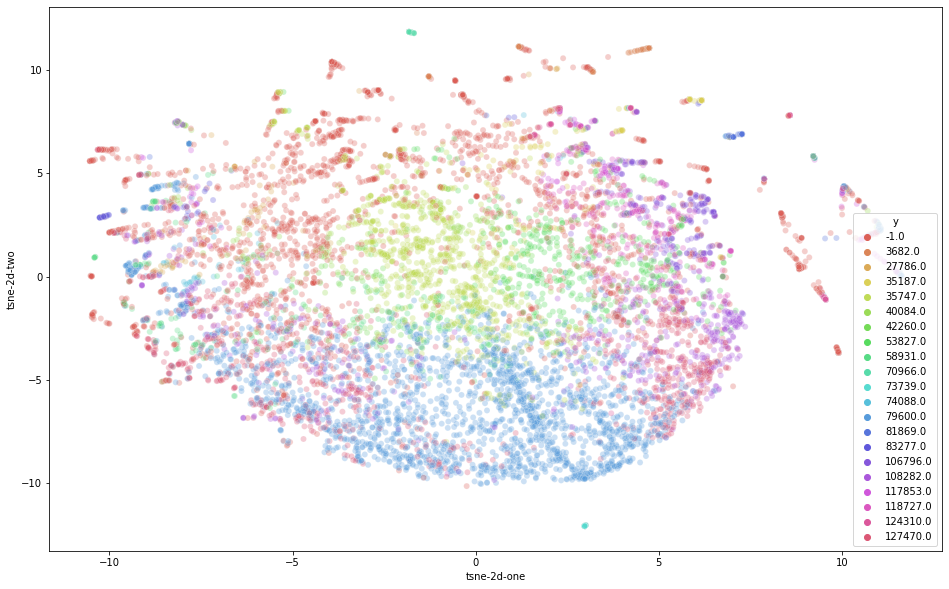

In [13]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 21),
    data=df_subset,
    legend="full",
    alpha=0.3
)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 20000 samples in 0.002s...
[t-SNE] Computed neighbors for 20000 samples in 21.762s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20000
[t-SNE] Computed conditional probabilities for sample 2000 / 20000
[t-SNE] Computed conditional probabilities for sample 3000 / 20000
[t-SNE] Computed conditional probabilities for sample 4000 / 20000
[t-SNE] Computed conditional probabilities for sample 5000 / 20000
[t-SNE] Computed conditional probabilities for sample 6000 / 20000
[t-SNE] Computed conditional probabilities for sample 7000 / 20000
[t-SNE] Computed conditional probabilities for sample 8000 / 20000
[t-SNE] Computed conditional probabilities for sample 9000 / 20000
[t-SNE] Computed conditional probabilities for sample 10000 / 20000
[t-SNE] Computed conditional probabilities for sample 11000 / 20000
[t-SNE] Computed conditional probabilities for sample 12000 / 20000
[t-SNE] Computed conditional probabilities for s

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

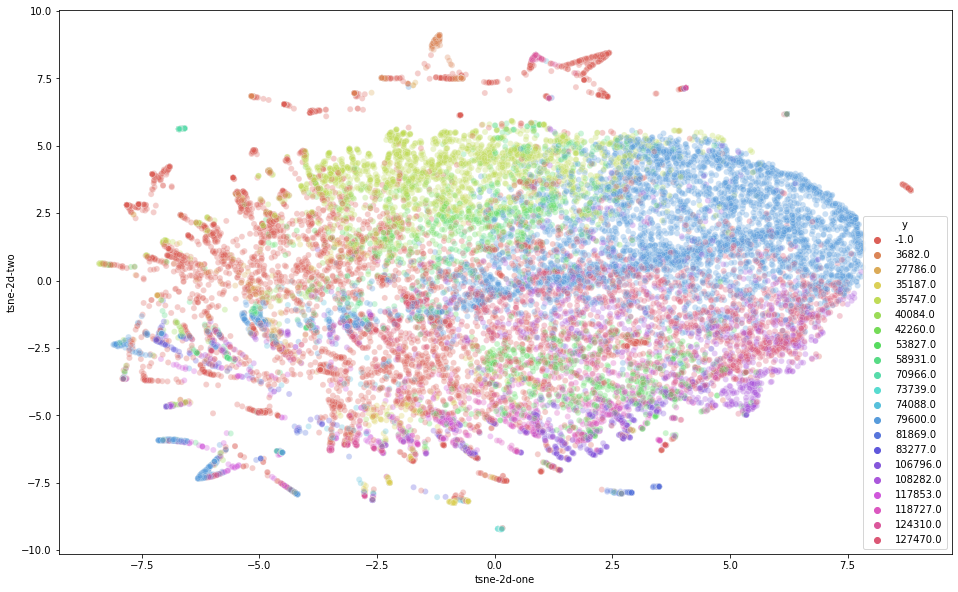

In [14]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 20000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values

import time

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 21),
    data=df_subset,
    legend="full",
    alpha=0.3
)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 0.925s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.212668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.418518
[t-SNE] KL divergence after 300 iterations: 1.825592
t-SNE done! Time elapsed: 10.307497024536133 seconds


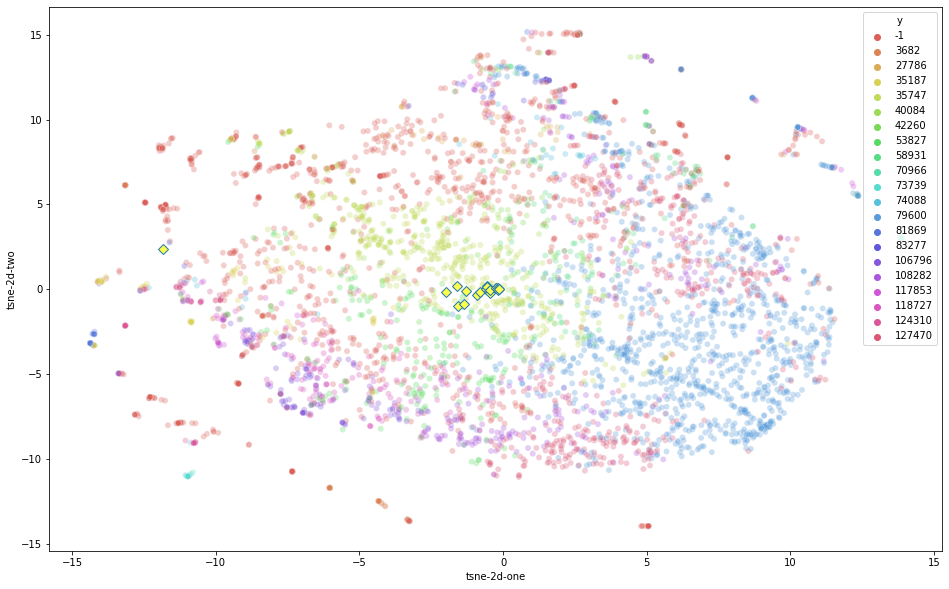

In [6]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values

import time

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 21),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

In [70]:
D = np.load('/Users/veronica/Desktop/dimentions_k20_l17.npy', allow_pickle=True)
# подпространства кластеров литературного датасета

In [24]:
for d in D:
    print(sorted(d))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14

In [66]:
all_D18 = [x for x in range(18)]
for d in D:
    print(list(set(all_D18) - set(d)))

[12]
[6]
[12, 6]
[0]
[12]
[6]
[12]
[0]
[0]
[12]
[1]
[0]
[6]
[7]
[]
[0, 12]
[2]
[12]
[]
[6]


In [72]:
# средний размер подпространства совпадает с заданным параметром l

sum_lens = 0
for d in D:
    sum_lens += len(d)
avg_len = sum_lens / len(D)
avg_len

17.0

**Bots**

In [76]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# bot results k 20 l 17
A = np.load('/Users/veronica/Desktop/bot_assigns_k20_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/bot_medoids_k20_l17.npy', allow_pickle=True)
D = np.load('/Users/veronica/Desktop/bot_dimentions_k20_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/BotDataset_k6n3_94065.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [15]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.007s...
[t-SNE] Computed neighbors for 5000 samples in 1.038s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.513917
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.085571
[t-SNE] KL divergence after 300 iterations: 1.699020


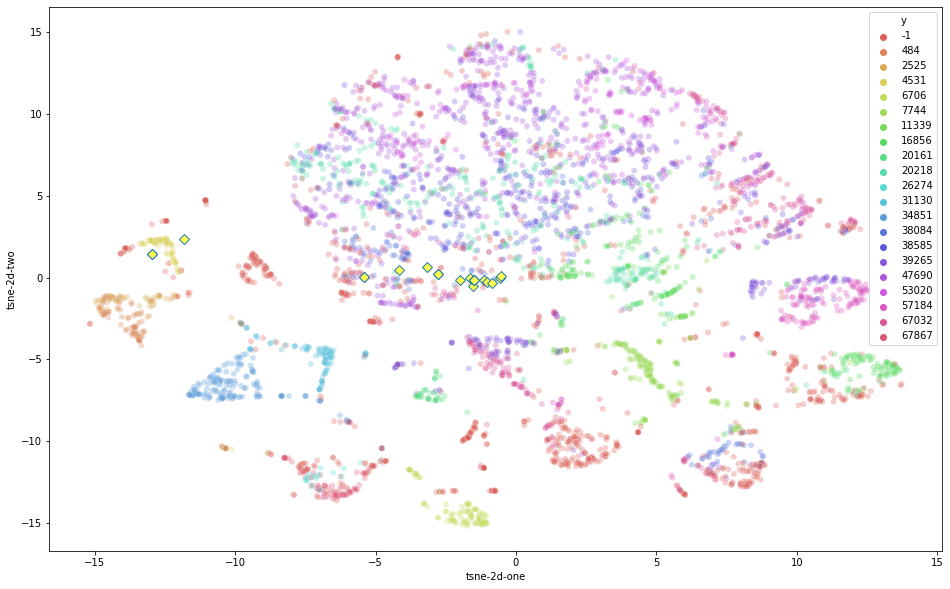

In [16]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 21),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 0.977s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.513917
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.941460
[t-SNE] KL divergence after 300 iterations: 1.407861


/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_70049/4062808582.py:15: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


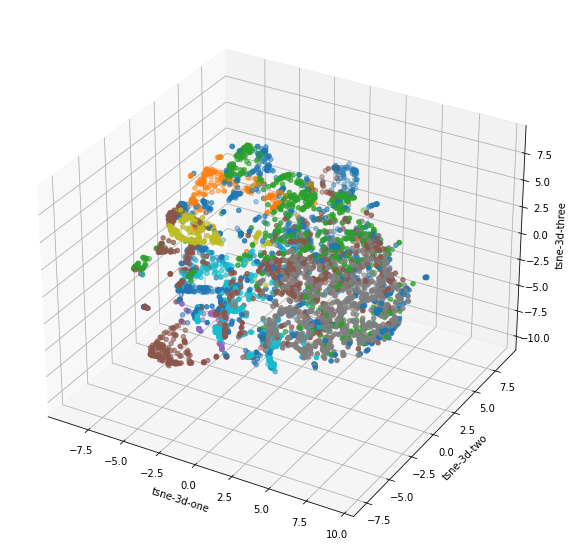

In [79]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='tab10'
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')
plt.show()

In [73]:
D = np.load('/Users/veronica/Desktop/bot_dimentions_k20_l17.npy', allow_pickle=True)
# подпространства кластеров сгенерированного ботом датасета

In [68]:
for d in D:
    print(sorted(d))

[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12

In [69]:
all_D18 = [x for x in range(18)]
for d in D:
    print(list(set(all_D18) - set(d)))

[6]
[12]
[12]
[0]
[6, 7]
[6]
[1]
[6]
[0]
[12]
[0]
[6]
[]
[]
[12]
[6]
[15]
[6]
[6]
[0, 12]


In [74]:
# средний размер подпространства совпадает с заданным параметром l

sum_lens = 0
for d in D:
    sum_lens += len(d)
avg_len = sum_lens / len(D)
avg_len

17.0

**Humans - other k clusterings**

In [18]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

A = np.load('/Users/veronica/Desktop/assigns_k15_l8.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k15_l8.npy', allow_pickle=True)
#D = np.load('/Users/veronica/Desktop/dimentions_k15_l8.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [19]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 1.178s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.212668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.418526
[t-SNE] KL divergence after 300 iterations: 1.825592


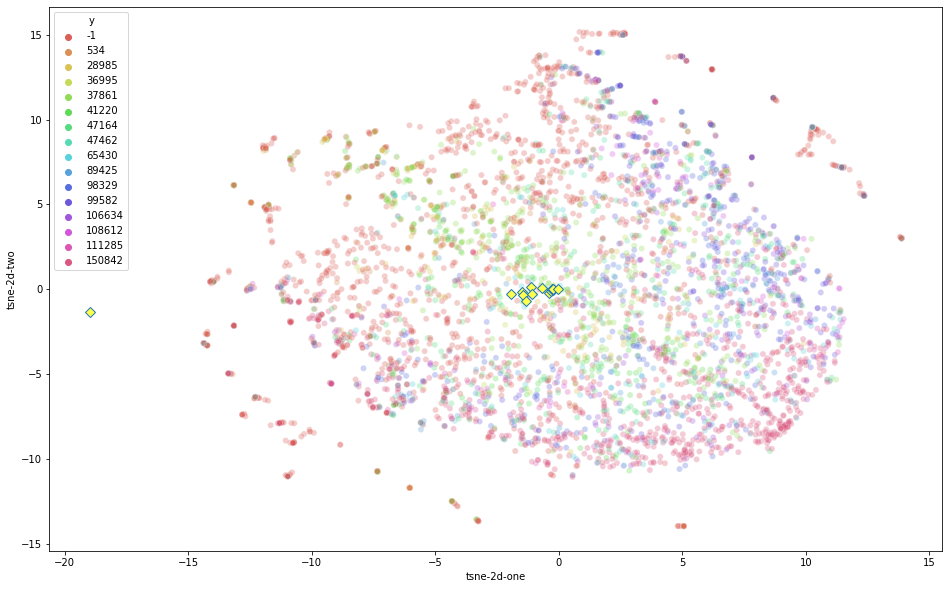

In [21]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 16),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

In [22]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

A = np.load('/Users/veronica/Desktop/assigns_k2_l14.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k2_l14.npy', allow_pickle=True)
#D = np.load('/Users/veronica/Desktop/dimentions_k2_l14.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [23]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 1.054s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.212668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.418518
[t-SNE] KL divergence after 300 iterations: 1.825592


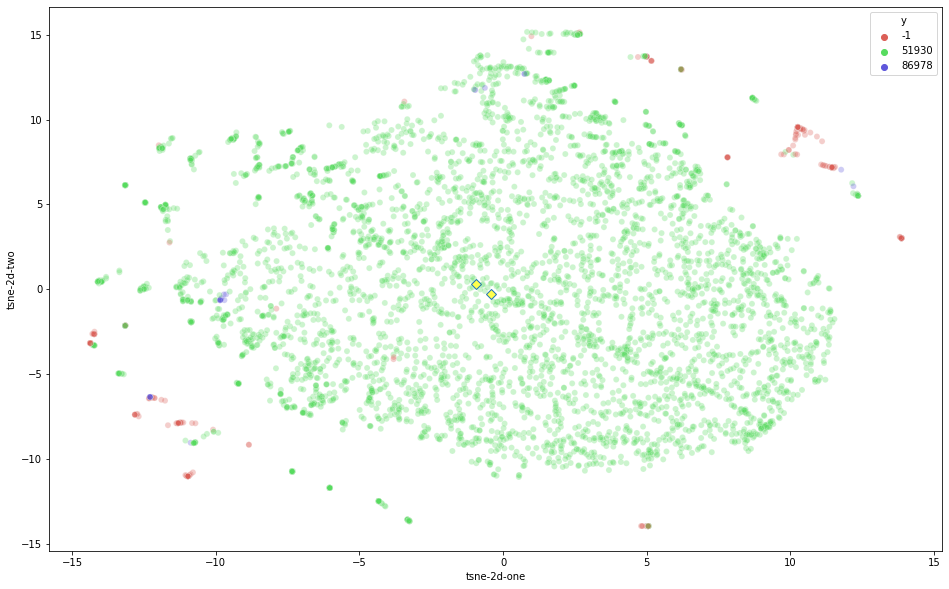

In [24]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 3),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

In [25]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

A = np.load('/Users/veronica/Desktop/assigns_k4_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k4_l17.npy', allow_pickle=True)
#D = np.load('/Users/veronica/Desktop/dimentions_k4_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [26]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 0.952s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.212668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.418526
[t-SNE] KL divergence after 300 iterations: 1.825592


In [ ]:
## df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 5),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

In [28]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

A = np.load('/Users/veronica/Desktop/assigns_k6_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k6_l17.npy', allow_pickle=True)
#D = np.load('/Users/veronica/Desktop/dimentions_k6_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [29]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 1.416s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.212668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.418526
[t-SNE] KL divergence after 300 iterations: 1.825592


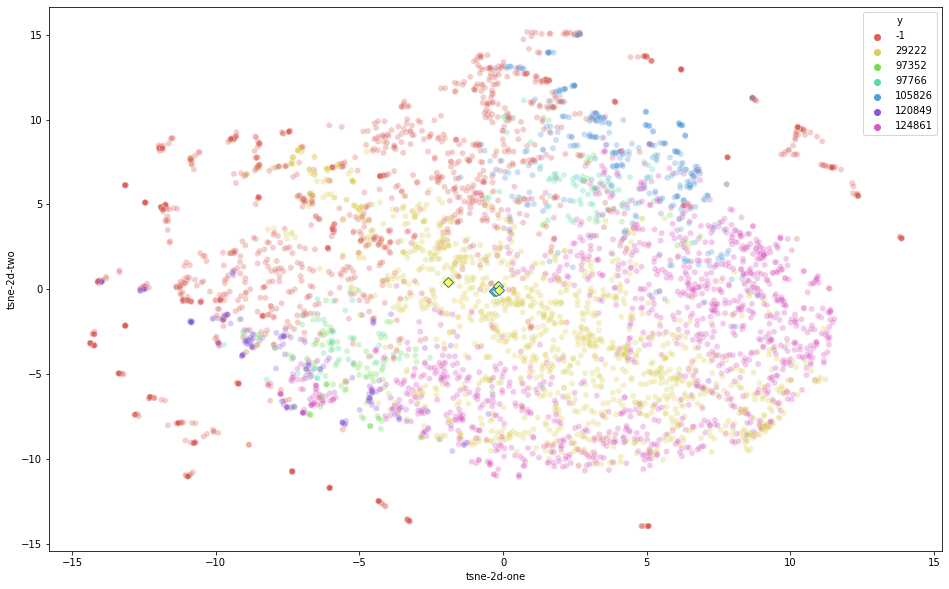

In [30]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 7),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

In [80]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

A = np.load('/Users/veronica/Desktop/assigns_k20_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k20_l17.npy', allow_pickle=True)
D = np.load('/Users/veronica/Desktop/dimentions_k20_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [81]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 1.020s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.212668
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.269272
[t-SNE] KL divergence after 300 iterations: 1.580123


/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_70049/3989774875.py:5: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


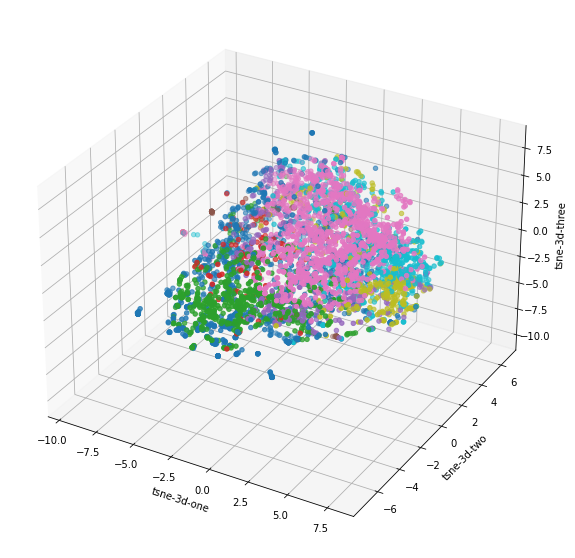

In [82]:
df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='tab10'
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')
plt.show()

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 0.874s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.235764
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.783470
[t-SNE] KL divergence after 300 iterations: 1.555906


/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_70049/1317330886.py:15: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


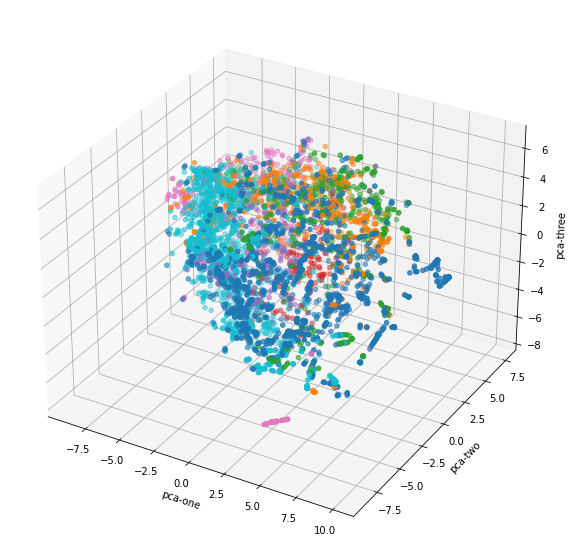

In [59]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

**Bots & Humans**

In [203]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

Xb = np.load('/Users/veronica/Desktop/BotDataset_k6n3_94065.npy', allow_pickle=True)
Xb = np.unique(Xb, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = 1
dfb = pd.DataFrame(Xb,columns=feat_cols)
dfb['y'] = 0

#df = pd.concat([df, dfb], ignore_index=True, sort=False)

In [204]:
N = 5000

np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])
df_subset = df.loc[rndperm[:N],:].copy()

rndperm = np.random.permutation(dfb.shape[0])
df_subset2 = dfb.loc[rndperm[:N],:].copy()

df_subset = pd.concat([df_subset, df_subset2], ignore_index=True, sort=False)

data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 4.134s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.271599
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.075798
[t-SNE] KL divergence after 300 iterations: 2.167084


/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/1290209035.py:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


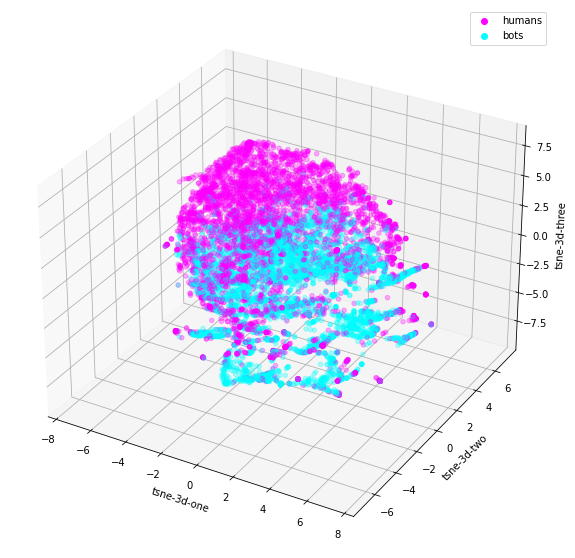

In [205]:
%matplotlib inline

df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='cool',
    alpha=0.3
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

<IPython.core.display.Javascript object>


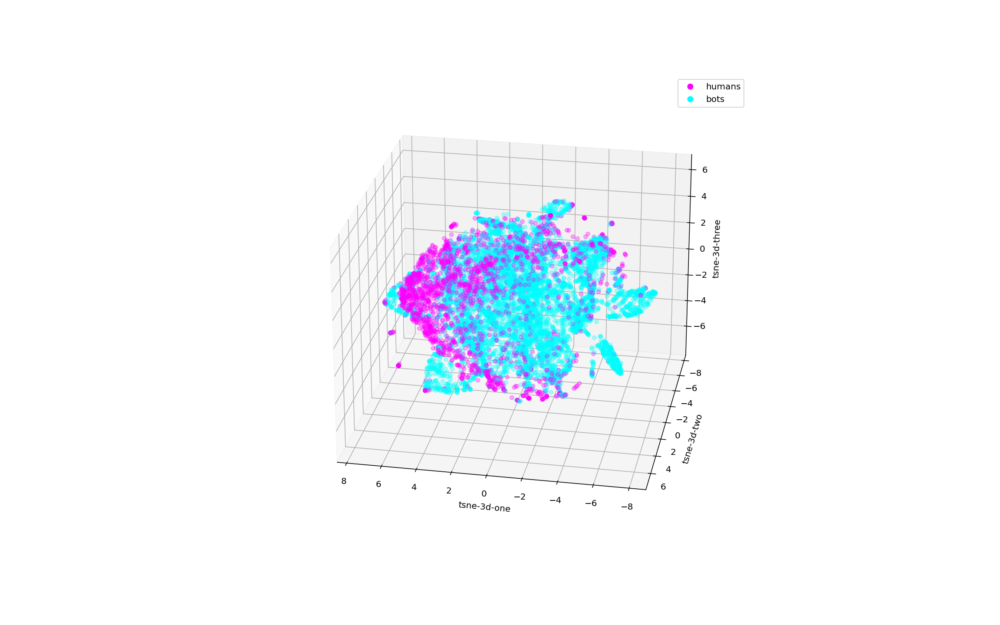

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/1601490734.py:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


In [198]:
%matplotlib notebook

df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='cool',
    alpha=0.3
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/2128035421.py:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


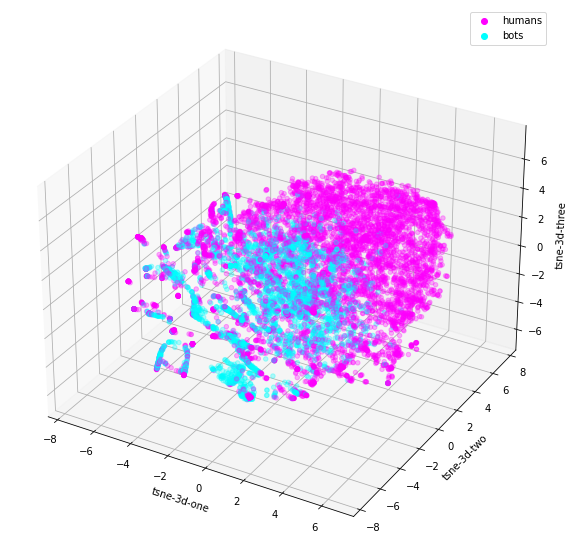

In [60]:
import matplotlib

df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='cool',
    alpha=0.3
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

In [72]:
df_subset

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,y,tsne-3d-one,tsne-3d-two,tsne-3d-three
161227,-7.863828,1.387900,-1.645020,-1.675134,0.490454,0.539370,-1.136495,-0.036704,0.010812,-0.043599,...,-0.657334,0.268630,0.316705,-0.027962,-0.057965,-0.002343,0,-7.412620,-1.249227,-1.275502
168839,-3.597589,-1.707300,0.241172,-0.578854,0.036099,0.159390,-1.349395,-0.027093,-0.173000,0.025727,...,-0.314796,-0.114450,-0.020388,0.024625,0.042680,0.006142,0,-1.702191,-2.751365,-6.054880
37732,-1.465900,0.045799,0.240659,0.062054,-0.100431,0.070068,-0.600154,-0.052400,0.267449,0.040992,...,-0.551410,-0.052015,0.070251,0.038200,-0.006583,-0.065669,1,-0.058747,2.968495,-2.182238
20755,-2.628622,-0.104379,-0.726238,0.230573,-0.190675,-0.249698,-0.289661,0.133252,0.108251,0.027282,...,-0.065452,0.057612,-0.006195,-0.020514,-0.026149,-0.009395,1,-3.931242,2.136090,-4.092980
96463,-0.323440,-0.128948,0.105778,-0.034900,0.009382,-0.034857,-0.218014,-0.121137,-0.035941,0.034151,...,-0.180410,-0.017888,-0.055870,0.019853,-0.006509,-0.008115,1,2.321944,4.759785,1.007535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18683,-2.866133,-0.622662,-0.791395,-0.240736,-0.089284,-0.341573,-0.555185,-0.288119,0.034272,0.119561,...,-1.608005,0.141625,-0.074560,0.038407,0.147460,-0.212604,1,-3.151616,0.341758,-1.682593
20577,-2.628622,-0.104379,-0.726238,0.230573,-0.190675,-0.249698,-10.447973,1.393168,2.726134,0.096450,...,-5.889428,2.615884,-0.951580,-1.380220,0.669711,1.301815,1,0.750797,-5.297919,3.385939
46975,-1.127820,0.029792,0.012801,-0.055173,0.140212,0.092949,-4.320771,-0.019058,-0.623571,-0.825003,...,-1.166026,-0.297323,0.026861,0.053656,-0.134425,-0.048911,1,2.091813,-3.886476,-4.433936
189763,-1.588425,0.113610,-0.152018,-0.211691,0.004547,0.142247,-1.820239,-0.147667,0.115093,0.023165,...,-0.575871,0.101462,-0.036860,-0.044056,0.105864,0.160224,0,1.622058,0.115478,-3.326431


In [79]:
df_tsne[df_tsne['y'] == 1]

,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
37732,-0.058747,2.968495,-2.182238,1
20755,-3.931242,2.136090,-4.092980,1
96463,2.321944,4.759785,1.007535,1
152688,3.711474,1.501899,4.264050,1
88334,2.448050,-4.191781,-4.334422,1
...,...,...,...,...
103437,2.164158,5.929757,1.546813,1
18683,-3.151616,0.341758,-1.682593,1
20577,0.750797,-5.297919,3.385939,1
46975,2.091813,-3.886476,-4.433936,1


In [208]:
df_subset.to_csv('/Users/veronica/Desktop/df_subset.csv')

In [209]:
df_subset = pd.read_csv('/Users/veronica/Desktop/df_subset.csv')

In [210]:
len(df_subset[df_subset['y'] == 0])

5000

In [76]:
type(df_tsne)

pandas.core.frame.DataFrame

In [80]:
len(df_tsne[df_tsne['y'] == 0])

3325

In [81]:
len(df_tsne[df_tsne['y'] == 1])

6675

**Симметрическая разность**

In [ ]:
import numpy as np
import pandas as pd

df_subset = pd.read_csv('/home/fibykov/veronica/df_subset.csv')

df_tsne = df_subset[['tsne-3d-one', 'tsne-3d-two', 'tsne-3d-three', 'y']]
df_diff = pd.DataFrame(columns=['tsne-3d-one', 'tsne-3d-two', 'tsne-3d-three', 'y'])

alpha = 0.1

for index0, row0 in df_tsne[df_tsne['y'] == 0].iterrows():
    is_separated = 1
    for index1, row1 in df_tsne[df_tsne['y'] == 1].iterrows():
        if np.linalg.norm(row0[['tsne-3d-one', 'tsne-3d-two', 'tsne-3d-three']] - row1[['tsne-3d-one', 'tsne-3d-two', 'tsne-3d-three']]) <= alpha:
            is_separated = 0
            break
    if is_separated == 1:
        df_diff = pd.concat([df_diff, df_tsne.iloc[[index0]]], sort=False)

for index1, row1 in df_tsne[df_tsne['y'] == 1].iterrows():
    is_separated = 1
    for index0, row0 in df_tsne[df_tsne['y'] == 0].iterrows():
        if np.linalg.norm(row0[['tsne-3d-one', 'tsne-3d-two', 'tsne-3d-three']] - row1[['tsne-3d-one', 'tsne-3d-two', 'tsne-3d-three']]) <= alpha:
            is_separated = 0
            break
    if is_separated == 1:
        df_diff = pd.concat([df_diff, df_tsne.iloc[[index1]]], sort=False)
            
df_diff.to_csv('/home/fibykov/veronica/diff01.csv')

In [ ]:
import numpy as np
import pandas as pd

X = np.load('/home/fibykov/veronica/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1])]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = 1

Xb = np.load('/home/fibykov/veronica/BotDataset_k6n3_94065.npy', allow_pickle=True)
Xb = np.unique(Xb, axis=0)

feat_cols = [str(i) for i in range(Xb.shape[1])]
dfb = pd.DataFrame(Xb,columns=feat_cols)
dfb['y'] = 0

df = pd.concat([df, dfb], ignore_index=True, sort=False)

feat_cols += 'y'
df_diff = pd.DataFrame(columns=feat_cols)

alpha = 0.1

for index0, row0 in df[df['y'] == 0].iterrows():
    is_separated = 1
    r0 = df.iloc[[index0]].drop(columns=['y'])
    for index1, row1 in df[df['y'] == 1].iterrows():
        r1 = df.iloc[[index1]].drop(columns=['y'])
        if np.linalg.norm(np.array(r1) - np.array(r0)) <= alpha:
            is_separated = 0
            break
    if is_separated == 1:
        df_diff = pd.concat([df_diff, df.iloc[[index0]]], sort=False)

for index1, row1 in df[df['y'] == 1].iterrows():
    is_separated = 1
    r1 = df.iloc[[index1]].drop(columns=['y'])
    for index0, row0 in df[df['y'] == 0].iterrows():
        r0 = df.iloc[[index0]].drop(columns=['y'])
        if np.linalg.norm(np.array(r1) - np.array(r0)) <= alpha:
            is_separated = 0
            break
    if is_separated == 1:
        df_diff = pd.concat([df_diff, df.iloc[[index1]]], sort=False)
            
df_diff.to_csv('/home/fibykov/veronica/real_diff01.csv')

<IPython.core.display.Javascript object>


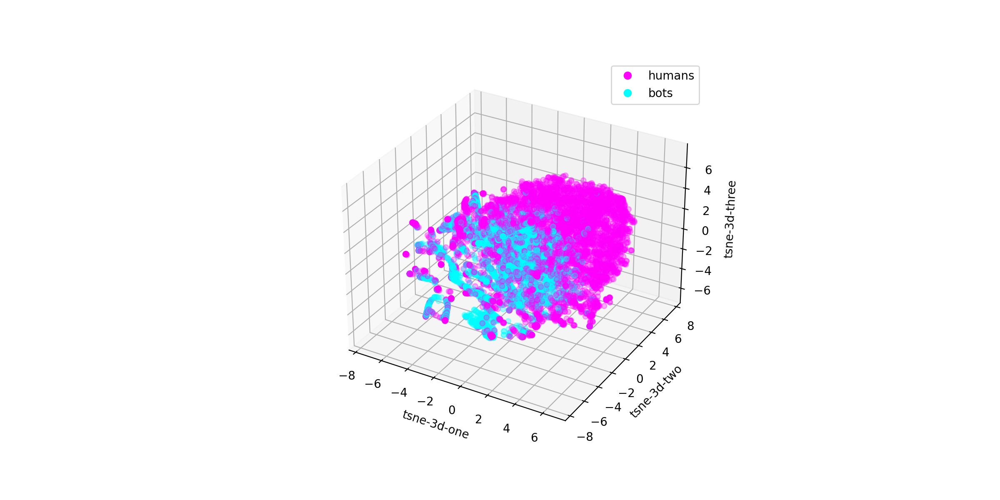

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/749686934.py:7: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(12,6)).gca(projection='3d')


In [64]:
%matplotlib notebook

df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(12,6)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='cool',
    alpha=0.3
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

In [95]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 10000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 6.634s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.241441
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.137436
[t-SNE] KL divergence after 300 iterations: 2.521610


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

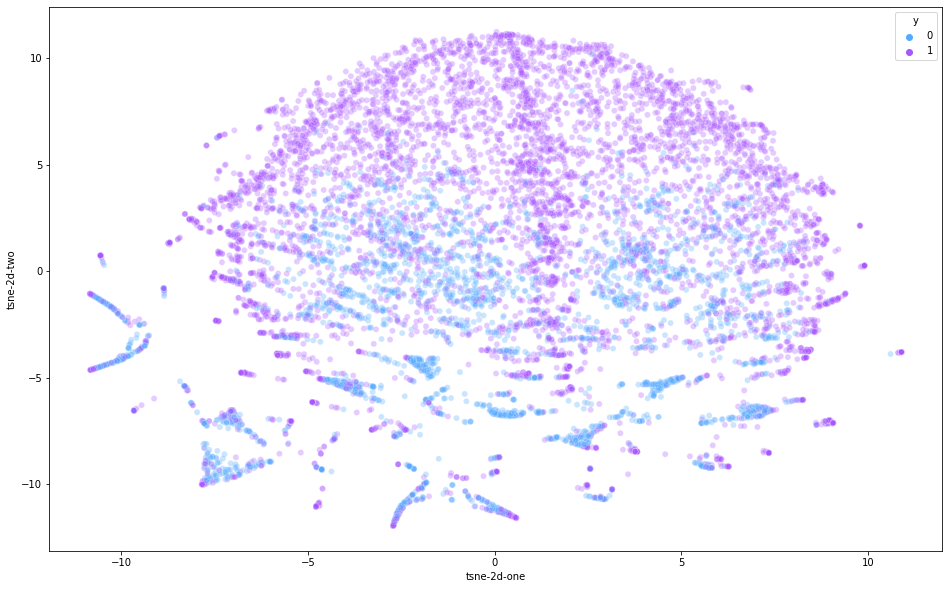

In [96]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("cool", 2),
    data=df_subset,
    legend="full",
    alpha=0.3
)

**Bots - other k clusterings**

In [4]:
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

# bot results k 8 l 17

A = np.load('/Users/veronica/Desktop/bot_assigns_k8_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/bot_medoids_k8_l17.npy', allow_pickle=True)
D = np.load('/Users/veronica/Desktop/bot_dimentions_k8_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/BotDataset_k6n3_94065.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['y'] = A.astype(int)
df['label'] = df['y'].apply(lambda i: str(i))

In [5]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 1.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.513917
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.085571
[t-SNE] KL divergence after 300 iterations: 1.699020


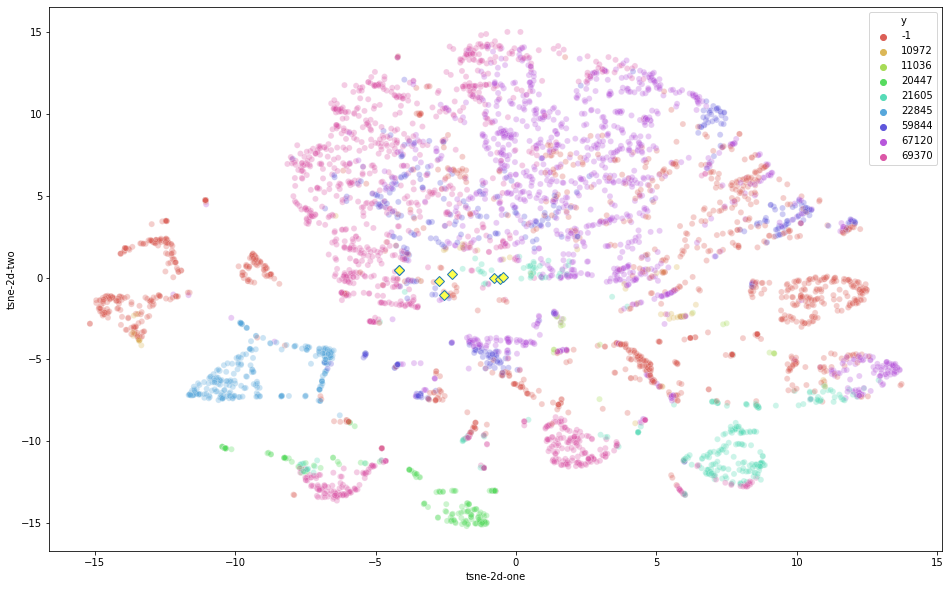

In [6]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 9),
    data=df_subset,
    legend="full",
    alpha=0.3
)
plt.plot(X[M,0], X[M,1], marker = 'D', mfc = '#FFFF4D', ms = 7, ls = '')

In [7]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

N = 5000
df_subset = df.loc[rndperm[:N],:].copy()
data_subset = df_subset[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 1.078s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.513917
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.941460
[t-SNE] KL divergence after 300 iterations: 1.407861


/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/3805252565.py:5: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


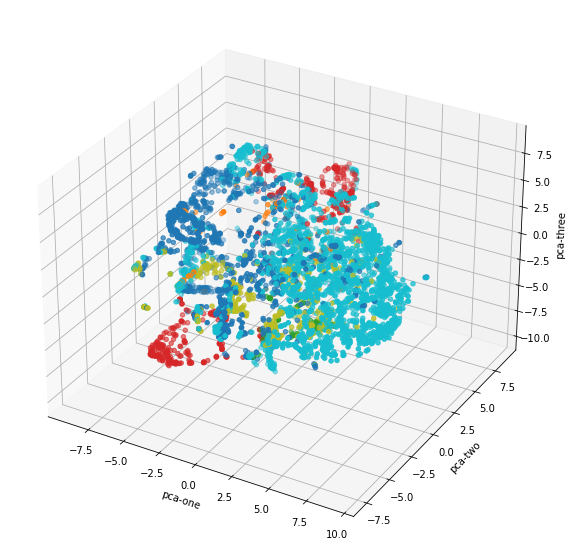

In [9]:
df_subset['tsne-3d-one'] = tsne_results[:,0]
df_subset['tsne-3d-two'] = tsne_results[:,1]
df_subset['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_subset['tsne-3d-one'], 
    ys=df_subset['tsne-3d-two'], 
    zs=df_subset['tsne-3d-three'], 
    c=df_subset["y"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

Общие n-граммы для датасетов ботов и людей

In [173]:
df_nonunique = df.drop(columns=['y'])
df_nonunique

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-11.834460,2.360270,1.380730,1.230841,-1.289959,-0.149354
1,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-9.492347,-0.444686,0.790913,-0.853357,-0.636630,0.088098
2,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-3.653063,1.045917,0.662019,0.001203,-0.481380,-0.865104
3,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-3.537682,0.609064,-0.308281,0.214707,-0.113047,-0.313213
4,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-2.185543,-0.183936,0.295270,0.718518,-0.207482,-0.013729
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230453,-0.008814,0.009071,0.002346,0.003402,0.001856,0.000809,-0.305991,-0.031141,0.134833,0.007685,0.035271,0.032573,-0.788198,-0.026786,-0.300581,0.152685,-0.000445,-0.090038
230454,-0.007936,-0.003410,-0.001512,-0.005695,-0.001149,-0.003696,-0.657334,0.268630,0.316705,-0.027962,-0.057965,-0.002343,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071
230455,-0.002876,0.004429,0.001603,0.002450,0.001154,0.000892,-3.597589,-1.707300,0.241172,-0.578854,0.036099,0.159390,-1.523027,-0.122927,-0.286135,-0.023893,0.088945,0.022001
230456,-0.000803,0.000871,-0.000240,0.000367,0.000267,0.000124,-11.834460,2.360270,1.380730,1.230841,-1.289959,-0.149354,-2.577778,-1.052210,0.072544,0.086975,0.161908,0.071347


In [179]:
df_unique = df_nonunique.drop_duplicates()
df_unique

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-11.834460,2.360270,1.380730,1.230841,-1.289959,-0.149354
1,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-9.492347,-0.444686,0.790913,-0.853357,-0.636630,0.088098
2,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-3.653063,1.045917,0.662019,0.001203,-0.481380,-0.865104
3,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-3.537682,0.609064,-0.308281,0.214707,-0.113047,-0.313213
4,-18.984652,-1.332155,0.912453,-3.674489,0.569046,1.525025,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071,-2.185543,-0.183936,0.295270,0.718518,-0.207482,-0.013729
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230453,-0.008814,0.009071,0.002346,0.003402,0.001856,0.000809,-0.305991,-0.031141,0.134833,0.007685,0.035271,0.032573,-0.788198,-0.026786,-0.300581,0.152685,-0.000445,-0.090038
230454,-0.007936,-0.003410,-0.001512,-0.005695,-0.001149,-0.003696,-0.657334,0.268630,0.316705,-0.027962,-0.057965,-0.002343,-12.961315,1.460462,0.923342,0.464815,0.378450,0.071071
230455,-0.002876,0.004429,0.001603,0.002450,0.001154,0.000892,-3.597589,-1.707300,0.241172,-0.578854,0.036099,0.159390,-1.523027,-0.122927,-0.286135,-0.023893,0.088945,0.022001
230456,-0.000803,0.000871,-0.000240,0.000367,0.000267,0.000124,-11.834460,2.360270,1.380730,1.230841,-1.289959,-0.149354,-2.577778,-1.052210,0.072544,0.086975,0.161908,0.071347


In [175]:
# количество повторяющихся n-граммы в датасетах ботов и людей

dupes = df_nonunique[~df_nonunique.isin(df_unique)].dropna()
len(dupes)

48

## Симметрическая разность с различными alpha - визуализация

In [201]:
# не равноценные кластеры ботов и людей в датасете :(

df_diff1 = pd.read_csv('/Users/veronica/Desktop/diff1.csv')
df_diff1

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,1991,-0.167414,-3.734673,-4.514908,0
1,2910,-0.568582,-3.444372,-4.050433,0
2,7549,-0.183441,-3.622969,-4.463257,0
3,7655,-2.789348,-3.100347,-0.785049,0
4,7726,-0.256974,-3.654612,-4.364963,0
...,...,...,...,...,...
1851,9954,6.037106,0.581131,0.616637,1
1852,9965,0.427311,6.011881,0.294064,1
1853,9971,2.356543,4.608118,-2.055519,1
1854,9979,5.963669,0.003705,-0.216082,1


<IPython.core.display.Javascript object>


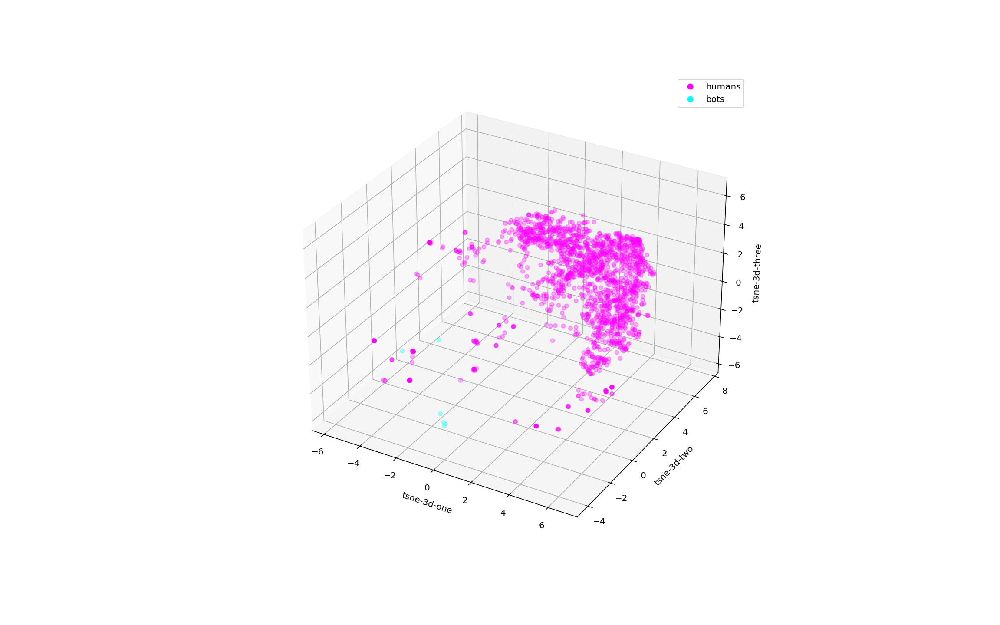

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/1100118379.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


In [202]:
import matplotlib

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_diff1['tsne-3d-one'], 
    ys=df_diff1['tsne-3d-two'], 
    zs=df_diff1['tsne-3d-three'], 
    c=df_diff1["y"], 
    cmap='cool',
    alpha=0.3
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

alpha = 1.0 [random sample dataset with even lables]

In [285]:
df_diff1 = pd.read_csv('/Users/veronica/Desktop/diff1.csv')
df_diff1

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,5009,1.981312,-0.911669,-3.658280,0
1,5012,2.744441,1.042202,-5.194159,0
2,5051,-1.505422,-1.750175,-6.434132,0
3,5052,1.317316,0.965706,-4.607341,0
4,5098,1.433669,1.076452,-4.762460,0
...,...,...,...,...,...
1248,4987,-5.164674,0.972357,4.461258,1
1249,4990,-4.298104,2.048353,5.862393,1
1250,4992,-3.707422,3.129446,4.058583,1
1251,4994,-4.608415,3.943872,2.816622,1


<IPython.core.display.Javascript object>


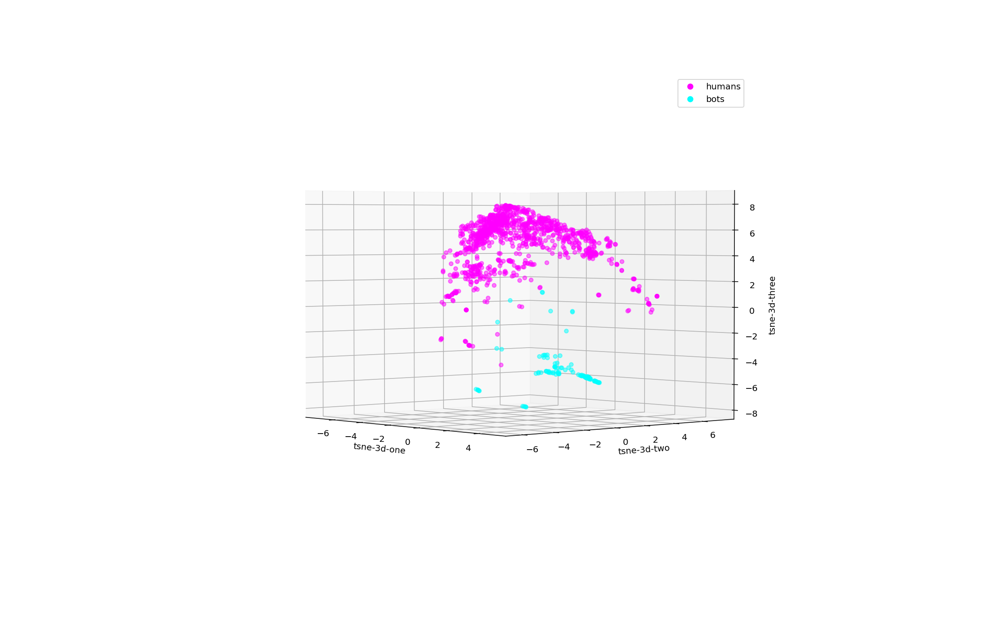

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/2146001773.py:3: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



In [286]:
import matplotlib

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_diff1['tsne-3d-one'], 
    ys=df_diff1['tsne-3d-two'], 
    zs=df_diff1['tsne-3d-three'], 
    c=df_diff1["y"], 
    cmap='cool',
    alpha=0.5
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

In [282]:
import plotly.graph_objects as go
import numpy as np

df_diff1_bot = df_diff1[df_diff1['y'] == 0]
df_diff1_human = df_diff1[df_diff1['y'] == 1]

x = df_diff1_human['tsne-3d-one']
y = df_diff1_human['tsne-3d-two']
z = df_diff1_human['tsne-3d-three']

x2 = df_diff1_bot['tsne-3d-one']
y2 = df_diff1_bot['tsne-3d-two']
z2 = df_diff1_bot['tsne-3d-three']

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                   alphahull=5,
                   opacity=0.4,
                   color='magenta'), go.Mesh3d(x=x2, y=y2, z=z2,
                   alphahull=5,
                   opacity=0.4,
                   color='cyan')])

fig.show()

alpha = 0.8 [random sample dataset with even lables]

In [283]:
df_diff08 = pd.read_csv('/Users/veronica/Desktop/diff08.csv')
df_diff08

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,5005,0.673822,1.553828,-2.265152,0
1,5009,1.981312,-0.911669,-3.658280,0
2,5012,2.744441,1.042202,-5.194159,0
3,5030,-1.777006,0.613298,1.021299,0
4,5051,-1.505422,-1.750175,-6.434132,0
...,...,...,...,...,...
1796,4990,-4.298104,2.048353,5.862393,1
1797,4992,-3.707422,3.129446,4.058583,1
1798,4993,-3.290591,1.150447,3.531216,1
1799,4994,-4.608415,3.943872,2.816622,1


<IPython.core.display.Javascript object>


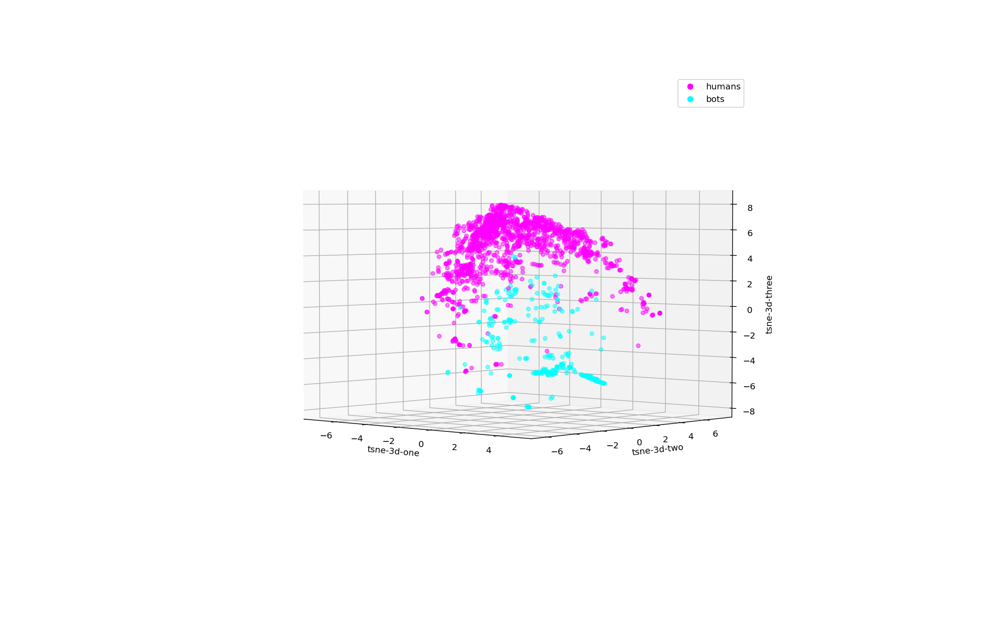

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/2892157166.py:4: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



In [284]:
%matplotlib notebook
import matplotlib

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_diff08['tsne-3d-one'], 
    ys=df_diff08['tsne-3d-two'], 
    zs=df_diff08['tsne-3d-three'], 
    c=df_diff08["y"], 
    cmap='cool',
    alpha=0.5
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

In [293]:
import plotly.graph_objects as go
import numpy as np

df_diff1_bot = df_diff1[df_diff1['y'] == 0]
df_diff1_human = df_diff1[df_diff1['y'] == 1]

x = df_diff1_human['tsne-3d-one']
y = df_diff1_human['tsne-3d-two']
z = df_diff1_human['tsne-3d-three']

x2 = df_diff1_bot['tsne-3d-one']
y2 = df_diff1_bot['tsne-3d-two']
z2 = df_diff1_bot['tsne-3d-three']

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                   alphahull=5,
                   opacity=0.4,
                   color='magenta'), go.Mesh3d(x=x2, y=y2, z=z2,
                   alphahull=5,
                   opacity=0.4,
                   color='cyan')])

fig.update_layout(autosize=False, width=500, height=500,)

fig.show()

alpha = 0.9 [random sample dataset with even lables]

In [294]:
df_diff09 = pd.read_csv('/Users/veronica/Desktop/diff09.csv')
df_diff09

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,5005,0.673822,1.553828,-2.265152,0
1,5009,1.981312,-0.911669,-3.658280,0
2,5012,2.744441,1.042202,-5.194159,0
3,5051,-1.505422,-1.750175,-6.434132,0
4,5052,1.317316,0.965706,-4.607341,0
...,...,...,...,...,...
1476,4987,-5.164674,0.972357,4.461258,1
1477,4990,-4.298104,2.048353,5.862393,1
1478,4992,-3.707422,3.129446,4.058583,1
1479,4994,-4.608415,3.943872,2.816622,1


In [295]:
import plotly.graph_objects as go
import numpy as np

df_diff1_bot = df_diff1[df_diff09['y'] == 0]
df_diff1_human = df_diff1[df_diff09['y'] == 1]

x = df_diff1_human['tsne-3d-one']
y = df_diff1_human['tsne-3d-two']
z = df_diff1_human['tsne-3d-three']

x2 = df_diff1_bot['tsne-3d-one']
y2 = df_diff1_bot['tsne-3d-two']
z2 = df_diff1_bot['tsne-3d-three']

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                   alphahull=5,
                   opacity=0.4,
                   color='magenta'), go.Mesh3d(x=x2, y=y2, z=z2,
                   alphahull=5,
                   opacity=0.4,
                   color='cyan')])

fig.update_layout(autosize=False, width=500, height=500,)

fig.show()

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/2391843337.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/2391843337.py:5: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [281]:
import plotly.graph_objects as go
import numpy as np

df_diff1_bot = df_diff08[df_diff08['y'] == 0]
df_diff1_human = df_diff08[df_diff08['y'] == 1]

x = df_diff1_human['tsne-3d-one']
y = df_diff1_human['tsne-3d-two']
z = df_diff1_human['tsne-3d-three']

x2 = df_diff1_bot['tsne-3d-one']
y2 = df_diff1_bot['tsne-3d-two']
z2 = df_diff1_bot['tsne-3d-three']

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                   alphahull=5,
                   opacity=0.4,
                   color='magenta'), go.Mesh3d(x=x2, y=y2, z=z2,
                   alphahull=5,
                   opacity=0.4,
                   color='cyan')])

#fig.update_layout(autosize=False, width=800, height=800,)

fig.show()

In [291]:
import plotly.graph_objects as go
import numpy as np

df_diff1_bot = df_diff065[df_diff065['y'] == 0]
df_diff1_human = df_diff065[df_diff065['y'] == 1]

x = df_diff1_human['tsne-3d-one']
y = df_diff1_human['tsne-3d-two']
z = df_diff1_human['tsne-3d-three']

x2 = df_diff1_bot['tsne-3d-one']
y2 = df_diff1_bot['tsne-3d-two']
z2 = df_diff1_bot['tsne-3d-three']

fig = go.Figure(data=[go.Mesh3d(x=x, y=y, z=z,
                   alphahull=5,
                   opacity=0.4,
                   color='magenta'), go.Mesh3d(x=x2, y=y2, z=z2,
                   alphahull=5,
                   opacity=0.4,
                   color='cyan')])

#fig.update_layout(autosize=False, width=800, height=800,)

fig.show()

alpha = 0.65 [random sample dataset with even lables]

In [289]:
df_diff065 = pd.read_csv('/Users/veronica/Desktop/diff065.csv')
df_diff065

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,5005,0.673822,1.553828,-2.265152,0
1,5009,1.981312,-0.911669,-3.658280,0
2,5012,2.744441,1.042202,-5.194159,0
3,5017,1.586356,1.409472,-0.514830,0
4,5030,-1.777006,0.613298,1.021299,0
...,...,...,...,...,...
2529,4992,-3.707422,3.129446,4.058583,1
2530,4993,-3.290591,1.150447,3.531216,1
2531,4994,-4.608415,3.943872,2.816622,1
2532,4996,-5.725261,1.936080,-0.020551,1


<IPython.core.display.Javascript object>


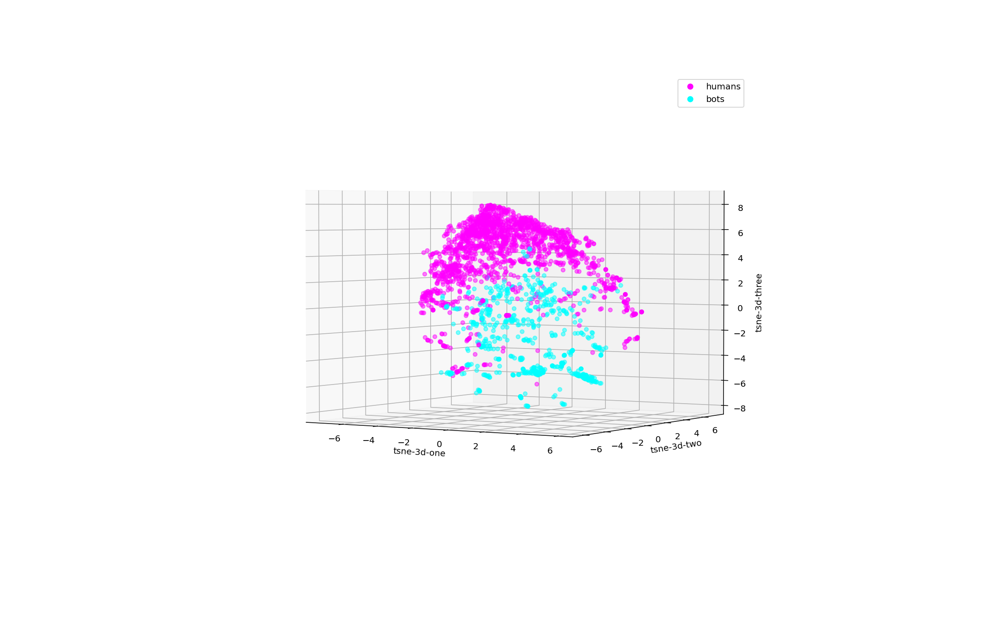

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/3325776068.py:3: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



In [290]:
import matplotlib

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_diff065['tsne-3d-one'], 
    ys=df_diff065['tsne-3d-two'], 
    zs=df_diff065['tsne-3d-three'], 
    c=df_diff065["y"], 
    cmap='cool',
    alpha=0.5
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

alpha = 0.5 [random sample dataset with even lables]

In [249]:
df_diff05 = pd.read_csv('/Users/veronica/Desktop/diff05.csv')
df_diff05

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,5005,0.673822,1.553828,-2.265152,0
1,5009,1.981312,-0.911669,-3.658280,0
2,5011,-0.731381,1.239997,-4.828729,0
3,5012,2.744441,1.042202,-5.194159,0
4,5014,-0.841522,2.539362,-5.503367,0
...,...,...,...,...,...
3548,4993,-3.290591,1.150447,3.531216,1
3549,4994,-4.608415,3.943872,2.816622,1
3550,4996,-5.725261,1.936080,-0.020551,1
3551,4997,-0.500669,3.041307,4.042436,1


<IPython.core.display.Javascript object>


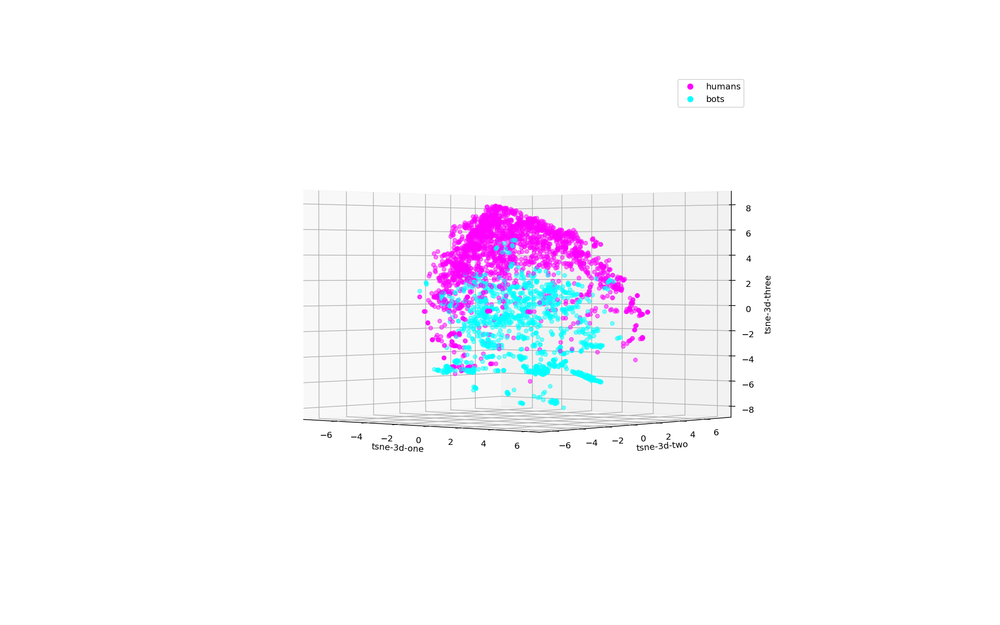

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/48177630.py:3: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



In [287]:
import matplotlib

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_diff05['tsne-3d-one'], 
    ys=df_diff05['tsne-3d-two'], 
    zs=df_diff05['tsne-3d-three'], 
    c=df_diff05["y"], 
    cmap='cool',
    alpha=0.5
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

alpha = 0.3 [random sample dataset with even lables]

In [251]:
df_diff03 = pd.read_csv('/Users/veronica/Desktop/diff03.csv')
df_diff03

,Unnamed: 0,tsne-3d-one,tsne-3d-two,tsne-3d-three,y
0,5000,-0.186846,2.038604,-0.293891,0
1,5001,1.145634,1.774594,3.347721,0
2,5002,0.541265,-1.342799,-1.790550,0
3,5005,0.673822,1.553828,-2.265152,0
4,5009,1.981312,-0.911669,-3.658280,0
...,...,...,...,...,...
5687,4994,-4.608415,3.943872,2.816622,1
5688,4995,3.027810,5.313791,-2.095819,1
5689,4996,-5.725261,1.936080,-0.020551,1
5690,4997,-0.500669,3.041307,4.042436,1


<IPython.core.display.Javascript object>


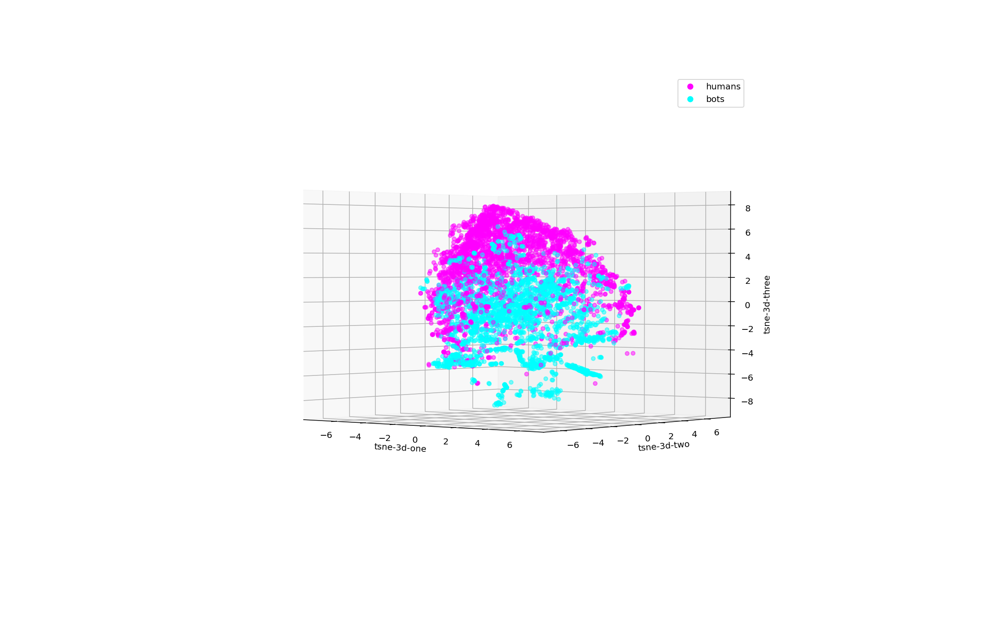

/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/2611669431.py:3: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



In [288]:
import matplotlib

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_diff03['tsne-3d-one'], 
    ys=df_diff03['tsne-3d-two'], 
    zs=df_diff03['tsne-3d-three'], 
    c=df_diff03["y"], 
    cmap='cool',
    alpha=0.5
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

Bot & human cluster centroids

In [213]:
# bot results k 8 l 17

Ab = np.load('/Users/veronica/Desktop/bot_assigns_k8_l17.npy', allow_pickle=True)
Mb = np.load('/Users/veronica/Desktop/bot_medoids_k8_l17.npy', allow_pickle=True)
Db = np.load('/Users/veronica/Desktop/bot_dimentions_k8_l17.npy', allow_pickle=True)
Xb = np.load('/Users/veronica/Desktop/BotDataset_k6n3_94065.npy', allow_pickle=True)
Xb = np.unique(Xb, axis=0)

feat_cols = [str(i) for i in range(Xb.shape[1]) ]
dfb = pd.DataFrame(Xb,columns=feat_cols)
dfb['label'] = Ab.astype(int)

In [228]:
bot_centroids_k8l17 = pd.DataFrame(columns=feat_cols)

meds = list(Mb.astype(int))

for m in meds:
    df_i = dfb[dfb['label'] == m]
    df_i = df_i.drop(columns='label')
    centroid = df_i.mean()
    centroid = pd.DataFrame(centroid).T
    bot_centroids_k8l17 = pd.concat([bot_centroids_k8l17, centroid], ignore_index=True, sort=False)

In [231]:
# 2nd best human [DB] k 20 l 17

A = np.load('/Users/veronica/Desktop/assigns_k20_l17.npy', allow_pickle=True)
M = np.load('/Users/veronica/Desktop/medoids_k20_l17.npy', allow_pickle=True)
D = np.load('/Users/veronica/Desktop/dimentions_k20_l17.npy', allow_pickle=True)
X = np.load('/Users/veronica/Desktop/datasetRU_k6n3_even_512.npy', allow_pickle=True)
X = np.unique(X, axis=0)

feat_cols = [str(i) for i in range(X.shape[1]) ]
df = pd.DataFrame(X,columns=feat_cols)
df['label'] = A.astype(int)

In [232]:
human_centroids_k20l17 = pd.DataFrame(columns=feat_cols)

meds = list(M.astype(int))

for m in meds:
    df_i = df[df['label'] == m]
    df_i = df_i.drop(columns='label')
    centroid = df_i.mean()
    centroid = pd.DataFrame(centroid).T
    human_centroids_k20l17 = pd.concat([human_centroids_k20l17, centroid], ignore_index=True, sort=False)

In [233]:
human_centroids_k20l17['y'] = 1
bot_centroids_k8l17['y'] = 0

In [234]:
df = pd.concat([bot_centroids_k8l17, human_centroids_k20l17], ignore_index=True, sort=False)

data_subset = df[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 27 nearest neighbors...
[t-SNE] Indexed 28 samples in 0.003s...
[t-SNE] Computed neighbors for 28 samples in 0.025s...
[t-SNE] Computed conditional probabilities for sample 28 / 28
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.959328
[t-SNE] KL divergence after 300 iterations: 2.341878


/var/folders/0b/qzq597zn7n7gqzxqfq5v8r5r0000gn/T/ipykernel_73880/3000132930.py:5: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = plt.figure(figsize=(16,10)).gca(projection='3d')


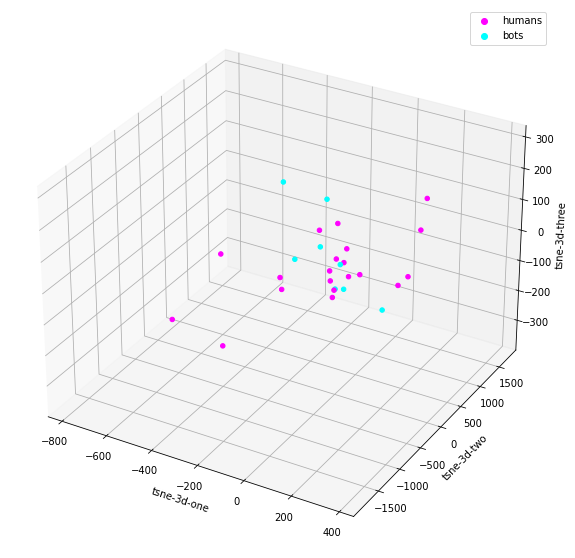

In [236]:
df['tsne-3d-one'] = tsne_results[:,0]
df['tsne-3d-two'] = tsne_results[:,1]
df['tsne-3d-three'] = tsne_results[:,2]

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df['tsne-3d-one'], 
    ys=df['tsne-3d-two'], 
    zs=df['tsne-3d-three'], 
    c=df["y"], 
    cmap='cool',
    alpha=1
)
ax.set_xlabel('tsne-3d-one')
ax.set_ylabel('tsne-3d-two')
ax.set_zlabel('tsne-3d-three')

scatter1_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='magenta', marker = 'o')
scatter2_proxy = matplotlib.lines.Line2D([0],[0], linestyle="none", c='aqua', marker = 'o')
ax.legend([scatter1_proxy, scatter2_proxy], ['humans', 'bots'], numpoints = 1)

plt.show()

In [237]:
df = pd.concat([bot_centroids_k8l17, human_centroids_k20l17], ignore_index=True, sort=False)

data_subset = df[feat_cols].values
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 27 nearest neighbors...
[t-SNE] Indexed 28 samples in 0.000s...
[t-SNE] Computed neighbors for 28 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 28 / 28
[t-SNE] Mean sigma: 1125899906842624.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 43.128639
[t-SNE] KL divergence after 300 iterations: 0.606572


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

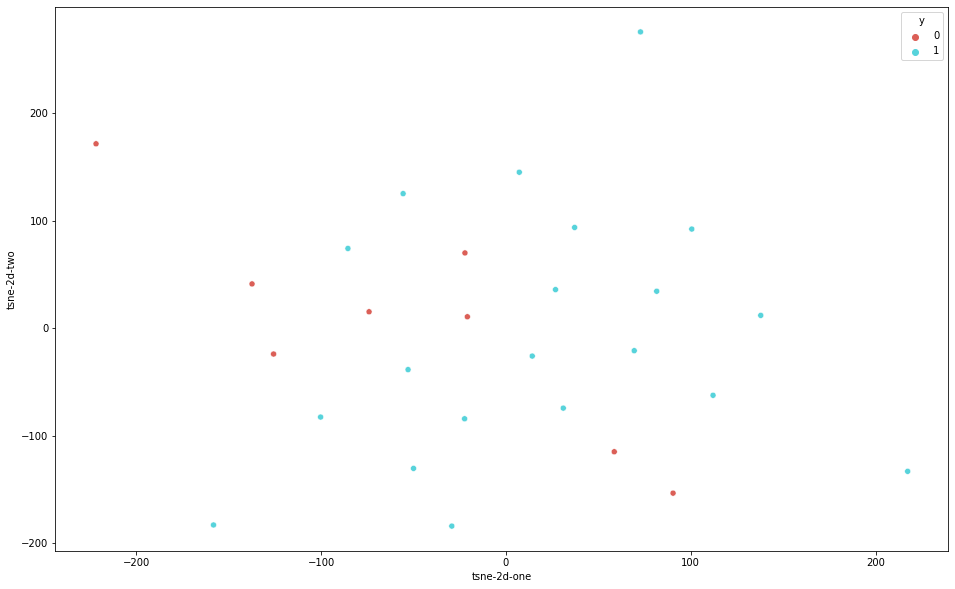

In [242]:
df['tsne-2d-one'] = tsne_results[:,0]
df['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 2),
    data=df,
    legend="full",
    alpha=1
)